In [1]:
## NOTES:
# pip install pytorch-lightning==1.5.10 
# use version 1.5.10  -> optimizer idx depreciated in newer versions

# apparently dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)
# num_workers > 0 does not work in jupyter vs code in windows

# Default Data Type: PyTorch layers and operations are optimized for torch.float32.

In [2]:
import os
import numpy as np
import cv2
# from PIL import Image
# from IPython.display import display, Image
import matplotlib.pyplot as plt
import random

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import ToTensor
from torchsummary import summary

import pytorch_lightning as pl


In [3]:
torch.cuda.empty_cache()

In [4]:
BATCH_SIZE = 10
AVAIL_GPUS = min(1, torch.cuda.device_count())
NUM_WORKERS = int(os.cpu_count()/2)
print("AVAIL_GPUS :",AVAIL_GPUS)
print("NUM_WORKERS :",NUM_WORKERS)

AVAIL_GPUS : 1
NUM_WORKERS : 4


In [ ]:
# Model overfitted with 10 imagaes
# The other data set has over 3000 images which is not feasible to run in my gTX 1650 graphic card

In [5]:
Train_Folder ='./Dataset/Train/'
# Train_Folder ='C:/Users/kevr0/OneDrive/Desktop/CPS-584/sculpture/Landscape/train1'
image_files= [f for f in os.listdir(Train_Folder) if f.endswith('.jpg')]


In [6]:
sketch_list = []
image_list = []

def generate_image(image_path):
    og_image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    n_image = cv2.resize(og_image, (128, 128))
    n_image = n_image/255.0
    n_image = n_image.astype(np.float32)
    return n_image

def generate_outline(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    n_image = cv2.resize(image, (256, 256))
    blurred = cv2.GaussianBlur(n_image, (3, 3), 1)
    edges = cv2.Canny(blurred, 30, 60)
    inverted_edges = cv2.bitwise_not(edges)
    resized_image = cv2.resize(inverted_edges, (128, 128))
    
    rgb_image = cv2.cvtColor(resized_image, cv2.COLOR_GRAY2RGB)
    
    gray_image_final = rgb_image/255.0
    # gray_image_final = np.expand_dims(gray_image_final, axis=-1)
    gray_image_final = gray_image_final.astype(np.float32)
    return gray_image_final

for image_file in image_files:
    image_path = os.path.join(Train_Folder, image_file)
    image_list.append(generate_image(image_path))
    sketch_list.append(generate_outline(image_path))
    
sketch_list[1].shape

(128, 128, 3)

In [7]:
image_list[1].shape

(128, 128, 3)

In [8]:
print(len(image_list))
print(len(sketch_list))

10
10


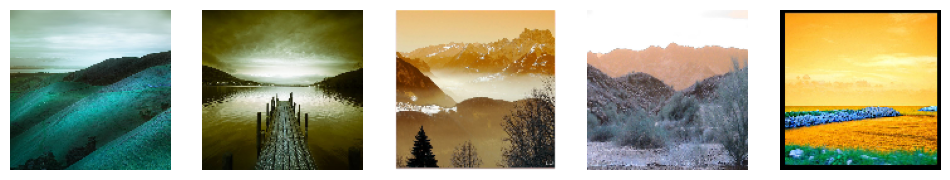

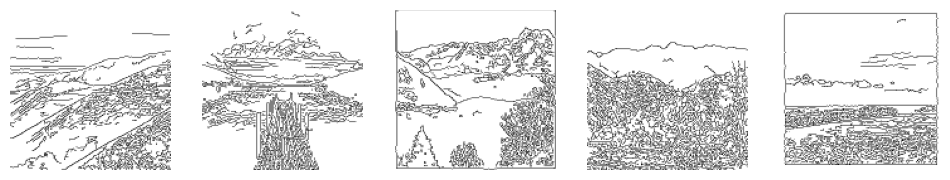

In [9]:
plt.figure(figsize=(12, 6))
for i in range(5):
    plt.subplot(2, 5, i + 1)
    plt.imshow(image_list[i], cmap='gray')
    plt.axis('off')
plt.show()
plt.figure(figsize=(12, 6))
for i in range(5):
    plt.subplot(2, 5, i + 1)
    plt.imshow(sketch_list[i], cmap='gray')
    plt.axis('off')
plt.show()

In [10]:

class ImageSketchDataset(Dataset):
    def __init__(self, images, sketches, transform):
        self.images = images
        self.sketches = sketches
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        sketch = self.sketches[idx]
        
        # Apply transformations if any
        if self.transform:
            image = self.transform(image)
            sketch = self.transform(sketch)
        
        return {'image': image, 'sketch': sketch}

# Convert images and sketches to PyTorch tensors
transform = ToTensor()

# Create the dataset
dataset = ImageSketchDataset(image_list, sketch_list, transform=transform)

# Create the DataLoader
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)
# dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)

In [13]:
for batch in dataloader:
    images = batch['image']
    sketches = batch['sketch']
    print('Batch of images shape:', images.shape)
    print('Batch of sketches shape:', sketches.shape)
    break

Batch of images shape: torch.Size([10, 3, 128, 128])
Batch of sketches shape: torch.Size([10, 3, 128, 128])


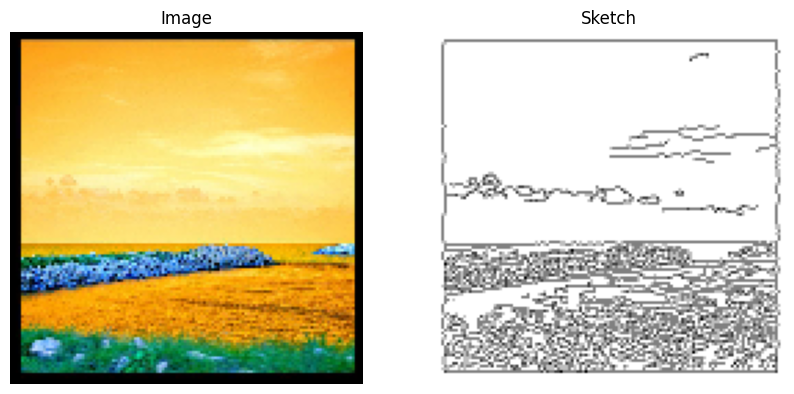

In [14]:
for batch in dataloader:
    images = batch['image']
    sketches = batch['sketch']
    break

# Select the first image and sketch from the batch
image = images[0].numpy().transpose(1, 2, 0)  # Convert from CHW to HWC format
sketch = sketches[0].numpy().transpose(1, 2, 0)  # Remove single-channel dimension if necessary

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Display the image
ax[0].imshow(image)
ax[0].set_title('Image')
ax[0].axis('off')

# Display the sketch
# ax[1].imshow(sketch, cmap='gray')
ax[1].imshow(sketch)
ax[1].set_title('Sketch')
ax[1].axis('off')

plt.show()

In [15]:
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

Using cuda device


# Conv2d
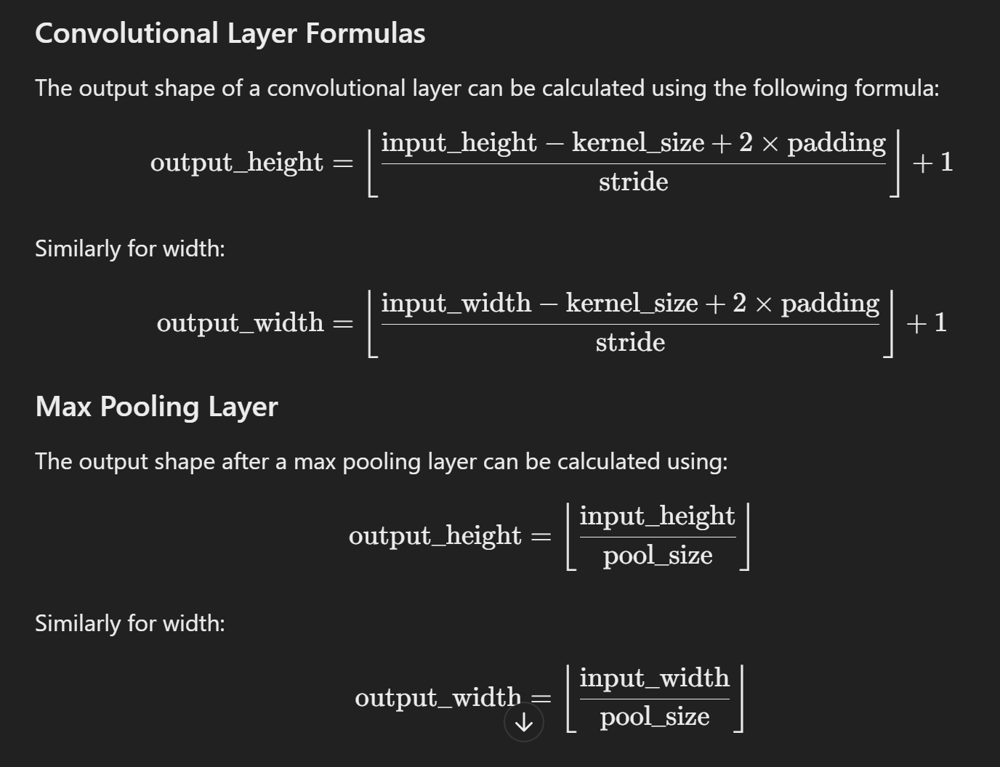

Used to flatten: value needs to be even?
x.view(-1, 64*64)


In [17]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=7, stride=1, padding=0)
        self.conv2 = nn.Conv2d(32, 32, kernel_size=7, stride=1, padding=0)
        
        self.conv3 = nn.Conv2d(32, 64, kernel_size=5, stride=1, padding=0)
        self.conv4 = nn.Conv2d(64, 64, kernel_size=5, stride=1, padding=0)
        
        self.conv5 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=0)
        self.conv6 = nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=0)
        
        self.conv7 = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=0)
        self.conv8 = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=0)
        
        self.fc1 = nn.Linear(256*3*3, 512)
        self.fc2 = nn.Linear(512, 64)
        self.fc3 = nn.Linear(64, 1)
        # self.fc4 = nn.Linear(16,1)
    
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.max_pool2d(x, 2)
        
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = F.max_pool2d(x, 2)
        
        x = F.relu(self.conv5(x))
        x = F.relu(self.conv6(x))
        x = F.max_pool2d(x, 2)
        
        x = F.relu(self.conv7(x))
        x = F.relu(self.conv8(x))
        x = F.max_pool2d(x, 2)
        
        # print("Shape before flattening:", x.shape)
        x = torch.flatten(x, 1)
        # print("Shape after flattening:", x.shape)
        # x = x.view(-1, 4608)
        
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        # x = F.relu(self.fc3(x))
        x = self.fc3(x)
        x = torch.sigmoid(x)
        return x



# ConvTranspose2d
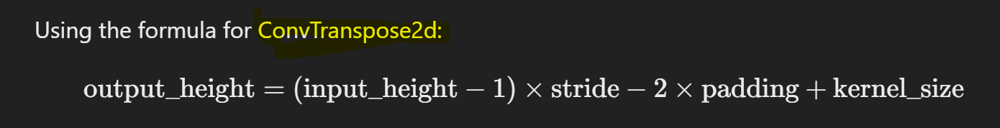
output_height=(input_height−1)×stride−2×padding+kernel_size
output_height=output_width

for :: nn.ConvTranspose2d(1, 64, kernel_size=4, stride=2, padding=1) 
will give output :: 64, output_height, output_width

if :: input = 1,128,128
then :: input_height = 128

In [18]:
# discriminator = Discriminator().to(device)
# print(summary(discriminator, (3, 128, 128)))

In [21]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv2_drop = nn.Dropout2d(p = 0.1)
        self.conv1 = nn.Conv2d(3, 16, kernel_size=5, stride=1, padding=0)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=0)
        self.conv3 = nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=0)
        
        self.conv4 = nn.Conv2d(32, 32, kernel_size=5, stride=1, padding=0)
        self.conv5 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=0)
        self.conv6 = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=0)
        
        self.conv7 = nn.Conv2d(64, 64, kernel_size=5, stride=1, padding=0)
        self.conv8 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=0)
        self.conv9 = nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=0)
        
        self.ct1 = nn.ConvTranspose2d(256, 128, kernel_size=3, stride=1, padding=0) 
        self.ct2 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=1, padding=0)
        self.ct3 = nn.ConvTranspose2d(64, 64, kernel_size=5, stride=1, padding=0)
        
        self.ct4 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=1, padding=0)
        self.ct5 = nn.ConvTranspose2d(64, 32, kernel_size=3, stride=1, padding=0)
        self.ct6 = nn.ConvTranspose2d(32, 32, kernel_size=5, stride=1, padding=0)
         
        self.ct7 = nn.ConvTranspose2d(64, 16, kernel_size=3, stride=1, padding=0)
        self.ct8 = nn.ConvTranspose2d(16, 3, kernel_size=3, stride=1, padding=0)
        self.ct9 = nn.ConvTranspose2d(3, 3, kernel_size=5, stride=1, padding=0)
        
    def forward(self, x):
        # Forward pass through the network
        x1 = F.leaky_relu(self.conv1(x))
        x1 = F.leaky_relu(self.conv2(x1))
        x1 = F.leaky_relu(self.conv3(x1)) #32
        
        x2 = F.leaky_relu(self.conv4(x1))
        x2 = F.leaky_relu(self.conv5(x2))
        x2 = F.leaky_relu(self.conv6(x2)) #64
        
        x3 = F.leaky_relu(self.conv7(x2))
        x3 = F.leaky_relu(self.conv8(x3))
        x3bottle = self.conv9(x3)
        x3 = F.leaky_relu(x3bottle) #128
   
        bottleneck = torch.tanh(x3bottle) #128
        
        concat1 = torch.cat([bottleneck, x3], dim=1) #128+128
        xt3 = F.relu(self.ct1(concat1))
        xt3 = F.relu(self.ct2(xt3))
        xt3 = F.relu(self.ct3(xt3))         # 64
        
        concat2 = torch.cat([xt3, x2], dim=1) #64 +64
        xt2 = F.relu(self.ct4(concat2))
        xt2 = F.relu(self.ct5(xt2))
        xt2 = F.relu(self.ct6(xt2))  #32
        
        concat3 = torch.cat([xt2, x1], dim=1)  #32+32
        xt1 = F.relu(self.ct7(concat3))
        xt1 = F.relu(self.ct8(xt1))
        xt1 = F.sigmoid(self.ct9(xt1))
    
        return xt1   

In [22]:
# generator = Generator().to(device)
# print(summary(generator, (3, 128, 128)))

In [24]:
class GAN(pl.LightningModule):
    def __init__(self, latent_dim=100, lr=0.0002):
        super().__init__()
        self.save_hyperparameters()
        self.generator = Generator().to(self.device)
        self.discriminator = Discriminator().to(self.device)
        self.mse = nn.MSELoss()

    def forward(self, z):
        return self.generator(z)
    
    def adversarial_loss(self, y_hat, y):
        return F.binary_cross_entropy(y_hat, y)
    
    def generator_loss(self, fake_output, real_y):
        return self.mse(fake_output, real_y)
    
    def training_step(self, batch, batch_idx, optimizer_idx):
        real_imgs = batch['image'].to(self.device)
        sketches = batch['sketch'].to(self.device)

        # Train Generator
        if optimizer_idx == 0:
            fake_imgs = self(sketches)
            g_loss = self.generator_loss(fake_imgs, real_imgs)
            
            log_dict = {"g_loss": g_loss.detach()}
            self.log("g_loss", g_loss, prog_bar=True, logger=True)
            return {"loss":g_loss, "progress_bar":log_dict, "log":log_dict}

        # Train Discriminator
        if optimizer_idx == 1:
            ### Labeling real images as real
            y_hat_real = self.discriminator(real_imgs)
            y_real = torch.ones(y_hat_real.size(0),1)
            y_real = y_real.type_as(y_hat_real)
            # adding noise
            y_real = y_real - (torch.rand(y_real.shape)*0.05).to(self.device)
            real_loss = self.adversarial_loss(y_hat_real, y_real)

            ### Labeling fake images as fake
            y_hat_fake = self.discriminator(self(sketches))
            y_fake = torch.zeros(y_hat_fake.size(0),1)
            y_fake = y_fake.type_as(y_hat_fake)
            # adding noise
            y_fake = y_fake + (torch.rand(y_fake.shape)*0.05).to(self.device)
            fake_loss = self.adversarial_loss(y_hat_fake, y_fake)

            d_loss = (real_loss + fake_loss)/2

            log_dict = {"d_loss": d_loss}
            self.log("d_loss", d_loss, prog_bar=True, logger=True)
            return {"loss":d_loss, "progress_bar":log_dict, "log":log_dict}


    def configure_optimizers(self):
        lr = self.hparams.lr
        opt_g = torch.optim.Adam(self.generator.parameters(), lr=lr)
        opt_d = torch.optim.Adam(self.discriminator.parameters(), lr=lr)
        return [opt_g, opt_d], []
    
    def plot_imgs(self, dataloader):
        for batch in dataloader:
            sketches = batch['sketch'].to(self.device)
            break
        sample_imgs = self(sketches).cpu()  # Generate images and move to CPU
        print('\nepoch ', self.current_epoch)
        fig = plt.figure()
        num_imgs = min(sample_imgs.size(0), 6)
        for i in range(num_imgs):
            plt.subplot(2, 3, i+1)
            plt.tight_layout()
            plt.imshow(sample_imgs.detach()[i].permute(1,2,0), interpolation='none')
            plt.title("Generated Data" )
            plt.xticks([])
            plt.yticks([])
            plt.axis('off')
        plt.show()
    
    def on_epoch_end(self):
        if (self.current_epoch + 1) % 50 == 0:
            self.plot_imgs(dataloader)


epoch  0


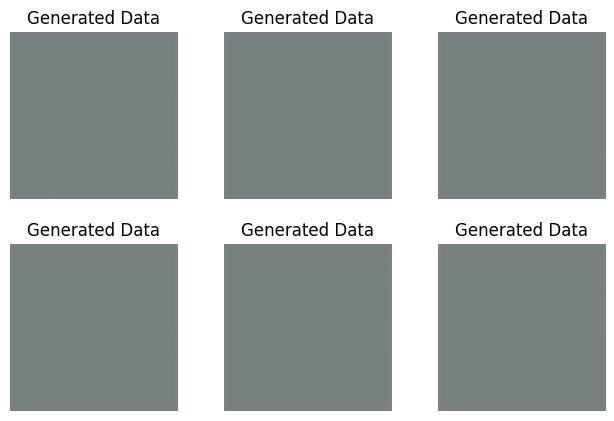

In [25]:
model = GAN()
model.plot_imgs(dataloader)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name          | Type          | Params
------------------------------------------------
0 | generator     | Generator     | 1.0 M 
1 | discriminator | Discriminator | 2.5 M 
2 | mse           | MSELoss       | 0     
------------------------------------------------
3.5 M     Trainable params
0         Non-trainable params
3.5 M     Total params
14.190    Total estimated model params size (MB)


Epoch 49: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s, loss=0.0784, v_num=7, g_loss=0.0337, d_loss=0.104] 
epoch  49


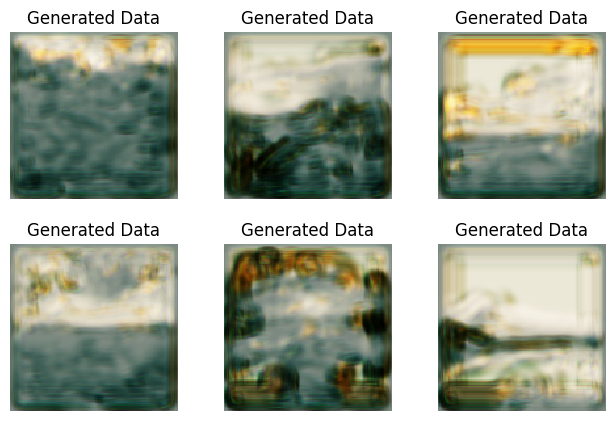

Epoch 99: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s, loss=0.072, v_num=7, g_loss=0.0257, d_loss=0.141]  
epoch  99


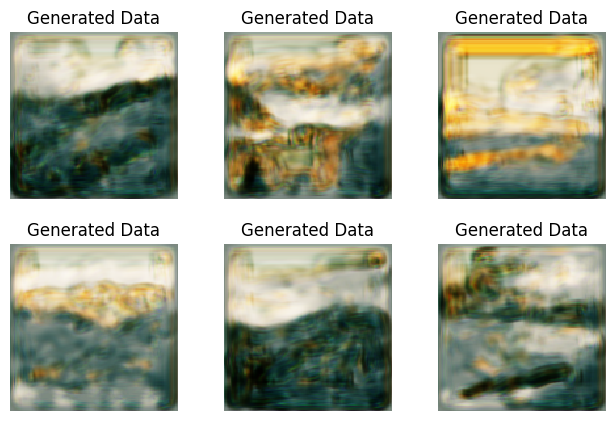

Epoch 149: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s, loss=0.0764, v_num=7, g_loss=0.0235, d_loss=0.115] 
epoch  149


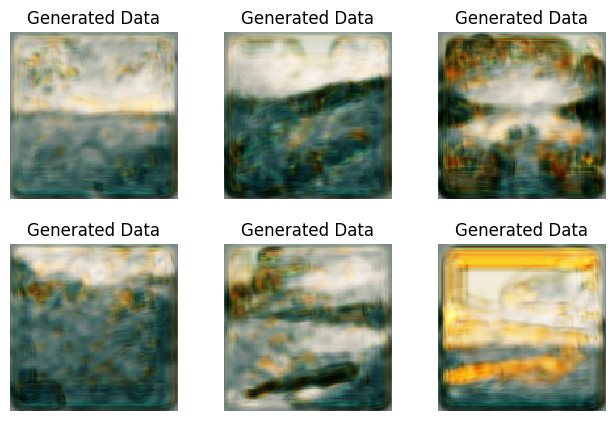

Epoch 199: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0701, v_num=7, g_loss=0.0255, d_loss=0.107] 
epoch  199


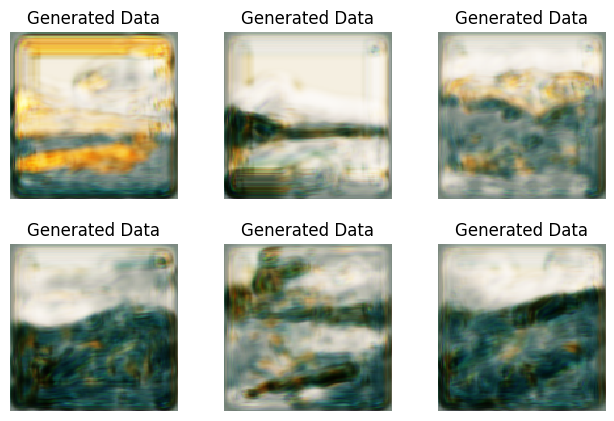

Epoch 249: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s, loss=0.0691, v_num=7, g_loss=0.0207, d_loss=0.0976]
epoch  249


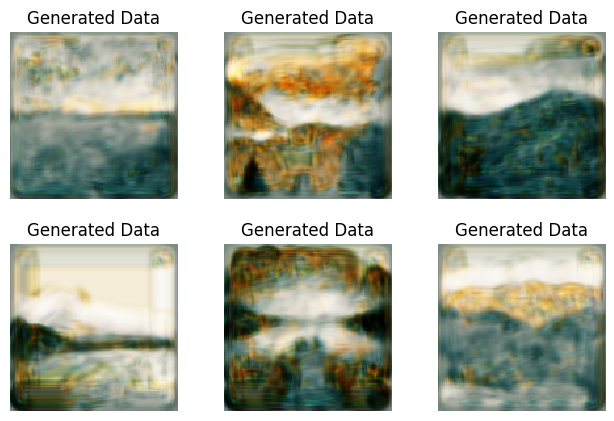

Epoch 299: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s, loss=0.0702, v_num=7, g_loss=0.0199, d_loss=0.117] 
epoch  299


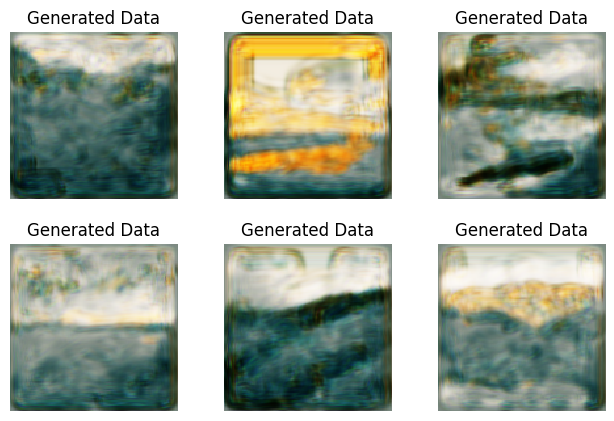

Epoch 349: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s, loss=0.0693, v_num=7, g_loss=0.0196, d_loss=0.102] 
epoch  349


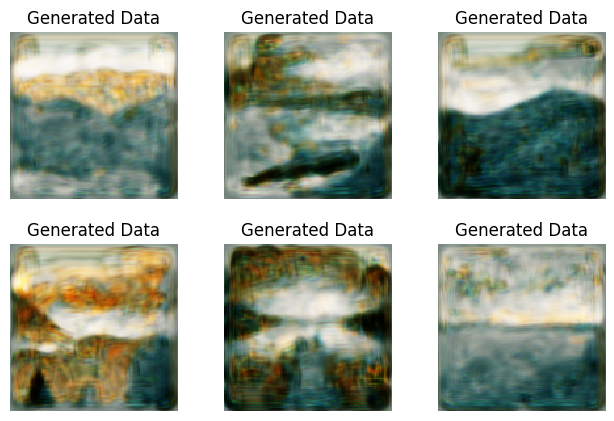

Epoch 399: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s, loss=0.0679, v_num=7, g_loss=0.019, d_loss=0.114]  
epoch  399


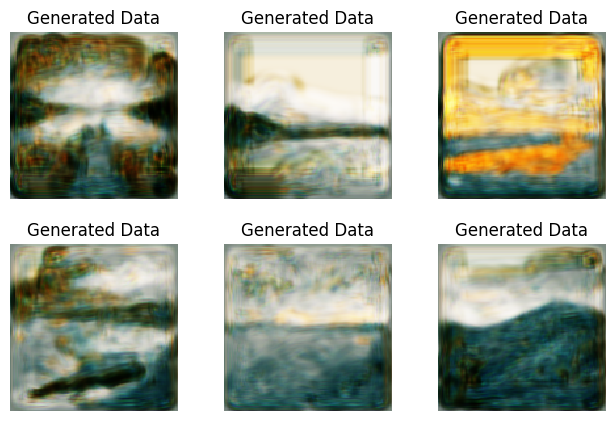

Epoch 449: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s, loss=0.0675, v_num=7, g_loss=0.0178, d_loss=0.127] 
epoch  449


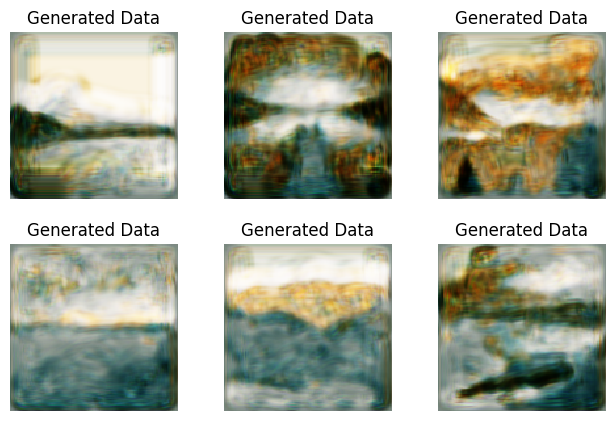

Epoch 499: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s, loss=0.0712, v_num=7, g_loss=0.0173, d_loss=0.129] 
epoch  499


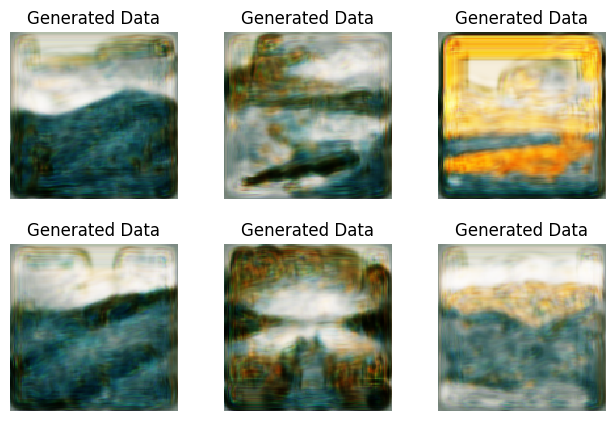

Epoch 549: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s, loss=0.067, v_num=7, g_loss=0.0168, d_loss=0.107]  
epoch  549


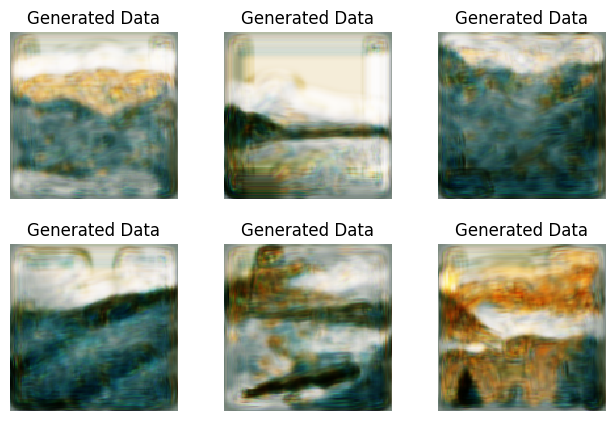

Epoch 599: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0698, v_num=7, g_loss=0.0157, d_loss=0.136] 
epoch  599


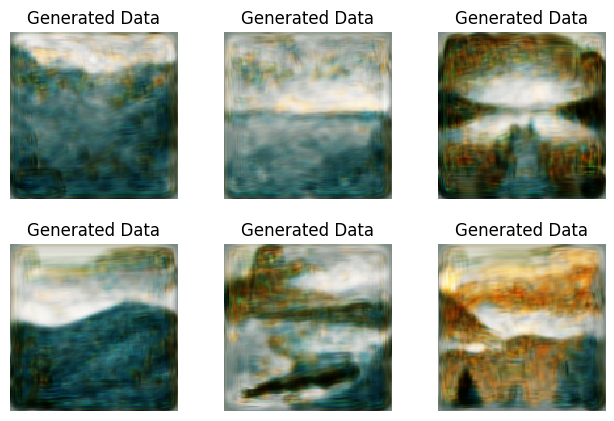

Epoch 649: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s, loss=0.0658, v_num=7, g_loss=0.016, d_loss=0.103] 
epoch  649


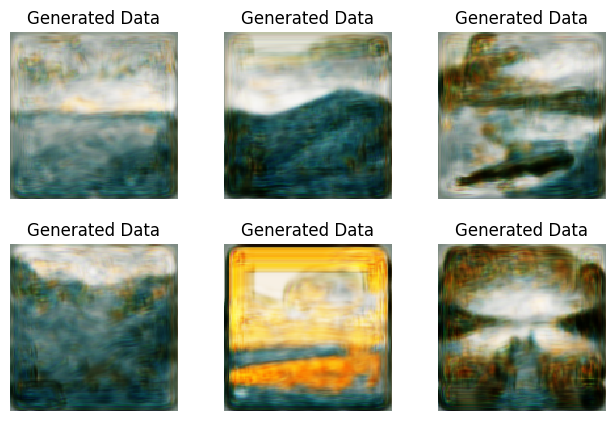

Epoch 699: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s, loss=0.0706, v_num=7, g_loss=0.0148, d_loss=0.129]
epoch  699


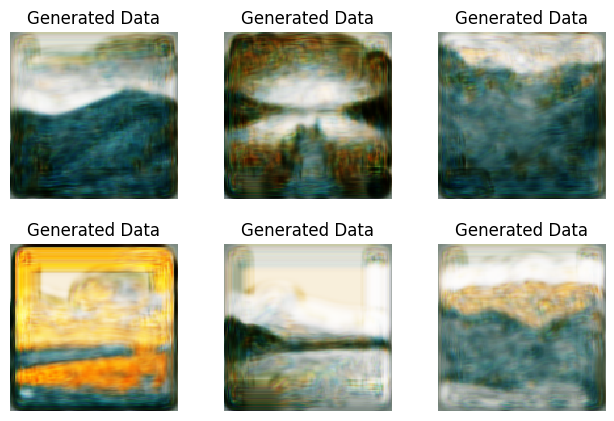

Epoch 749: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0665, v_num=7, g_loss=0.0143, d_loss=0.121] 
epoch  749


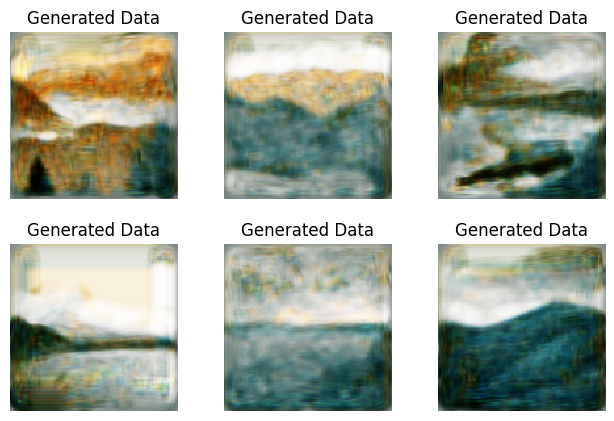

Epoch 799: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s, loss=0.138, v_num=7, g_loss=0.0146, d_loss=0.271]  
epoch  799


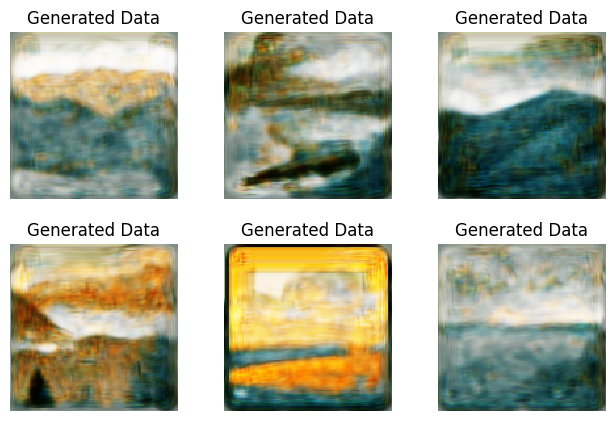

Epoch 849: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s, loss=0.138, v_num=7, g_loss=0.0144, d_loss=0.248] 
epoch  849


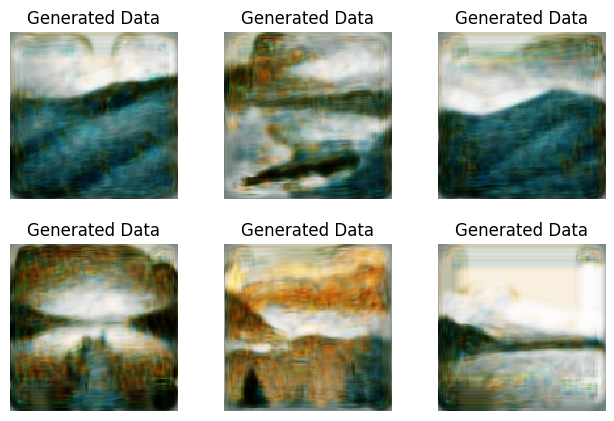

Epoch 899: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s, loss=0.0664, v_num=7, g_loss=0.0136, d_loss=0.146] 
epoch  899


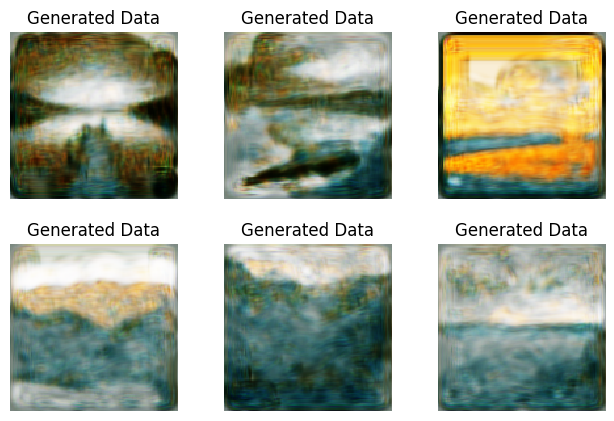

Epoch 949: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0669, v_num=7, g_loss=0.0152, d_loss=0.148] 
epoch  949


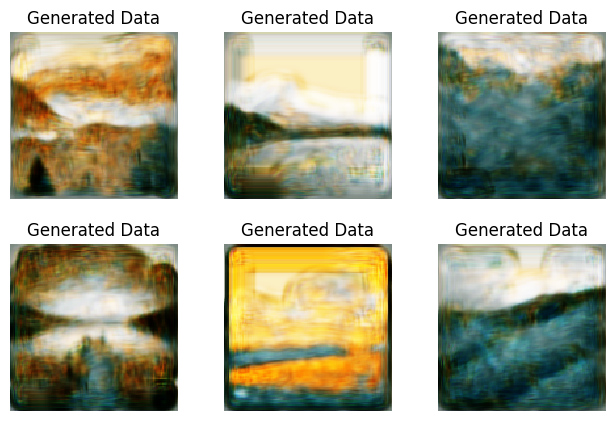

Epoch 999: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s, loss=0.0636, v_num=7, g_loss=0.0134, d_loss=0.101]
epoch  999


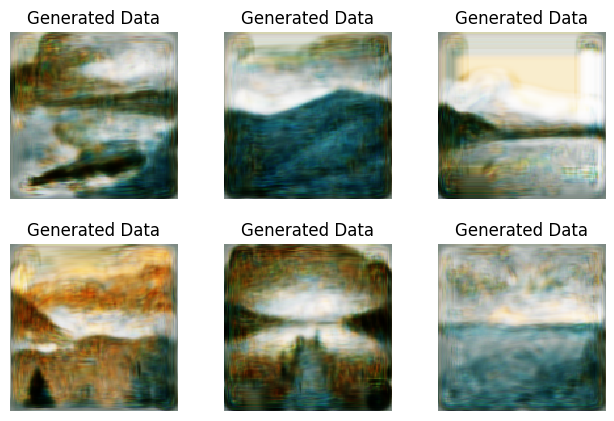

Epoch 1049: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0704, v_num=7, g_loss=0.015, d_loss=0.118]  
epoch  1049


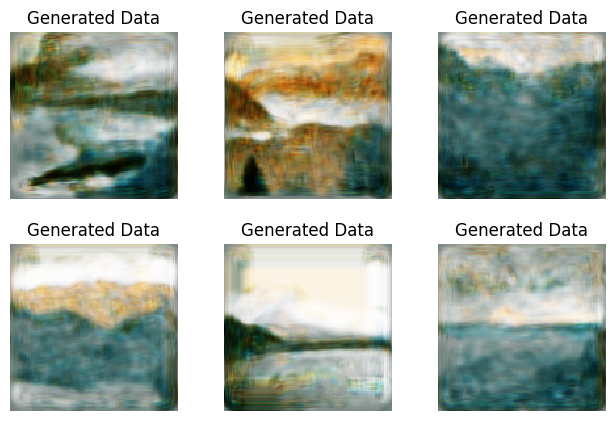

Epoch 1099: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s, loss=0.0641, v_num=7, g_loss=0.0124, d_loss=0.0978]
epoch  1099


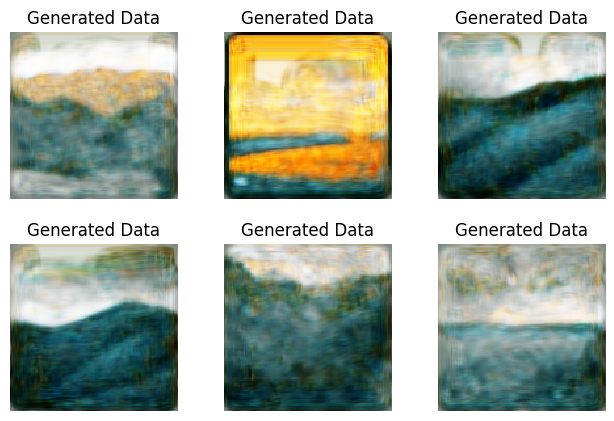

Epoch 1149: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s, loss=0.0672, v_num=7, g_loss=0.0125, d_loss=0.145] 
epoch  1149


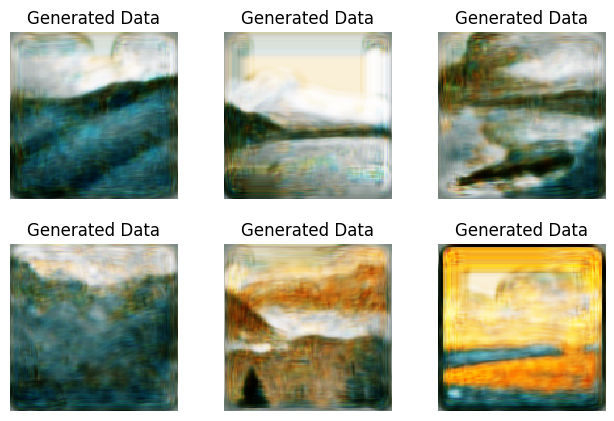

Epoch 1199: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0653, v_num=7, g_loss=0.0121, d_loss=0.131] 
epoch  1199


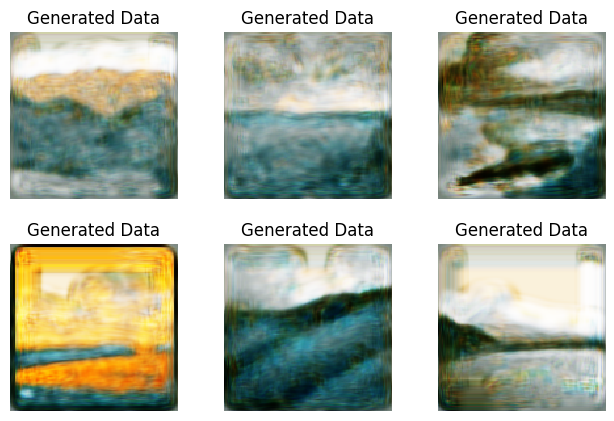

Epoch 1249: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0661, v_num=7, g_loss=0.0122, d_loss=0.118]
epoch  1249


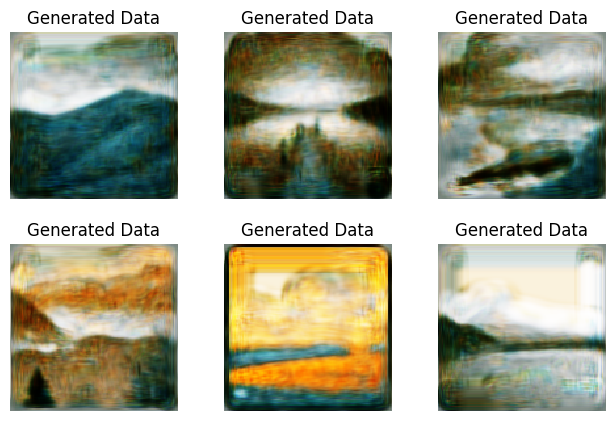

Epoch 1299: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s, loss=0.0693, v_num=7, g_loss=0.0175, d_loss=0.119] 
epoch  1299


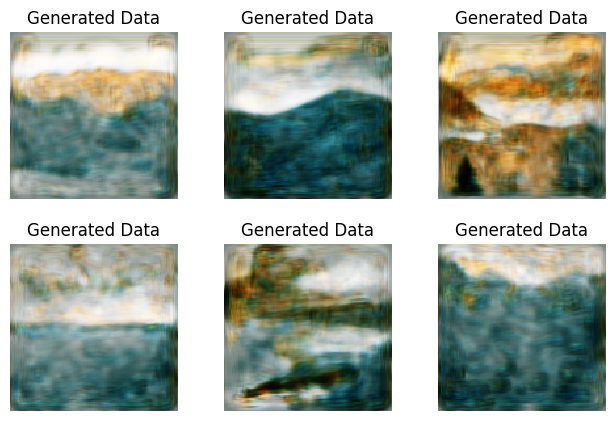

Epoch 1349: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s, loss=0.064, v_num=7, g_loss=0.0117, d_loss=0.117]  
epoch  1349


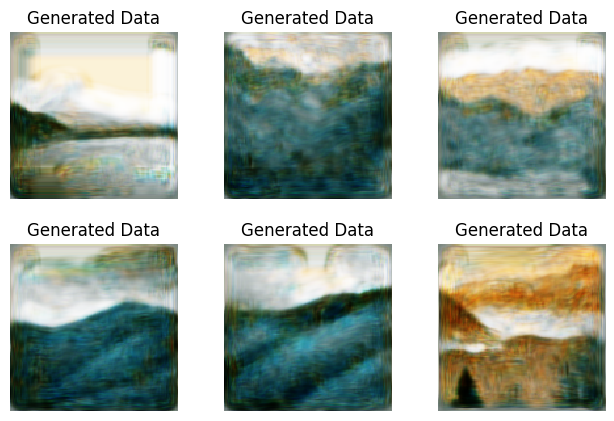

Epoch 1399: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s, loss=0.0637, v_num=7, g_loss=0.0112, d_loss=0.102] 
epoch  1399


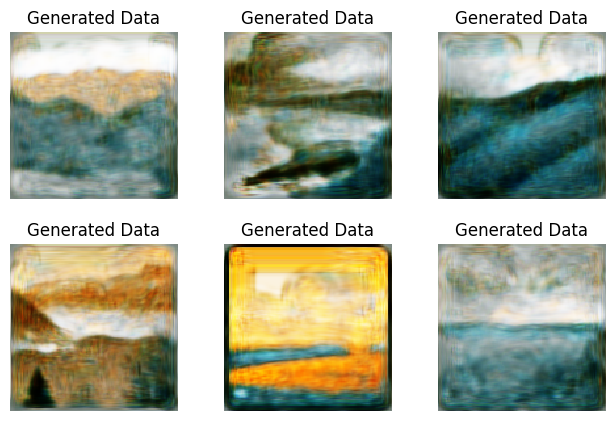

Epoch 1449: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s, loss=0.0666, v_num=7, g_loss=0.0121, d_loss=0.112] 
epoch  1449


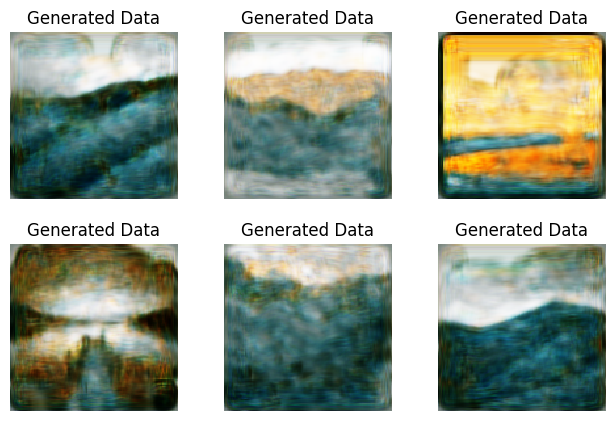

Epoch 1499: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s, loss=0.0645, v_num=7, g_loss=0.0148, d_loss=0.108] 
epoch  1499


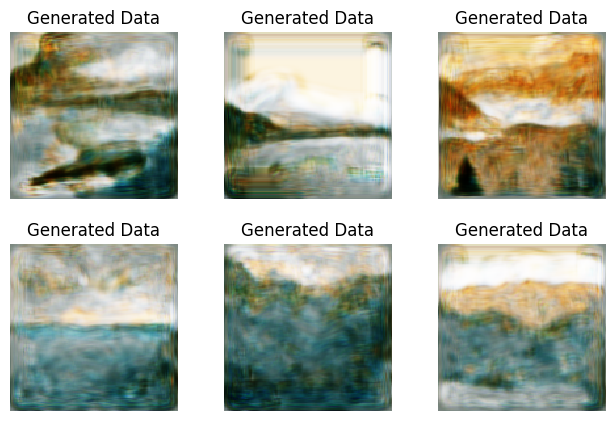

Epoch 1549: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0654, v_num=7, g_loss=0.0109, d_loss=0.116] 
epoch  1549


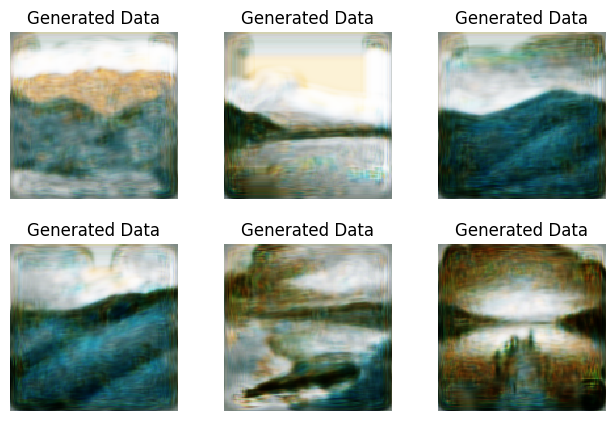

Epoch 1599: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0618, v_num=7, g_loss=0.011, d_loss=0.135]  
epoch  1599


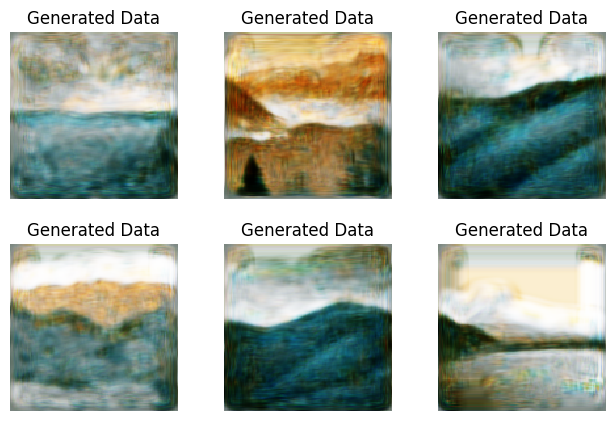

Epoch 1649: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0643, v_num=7, g_loss=0.0105, d_loss=0.135] 
epoch  1649


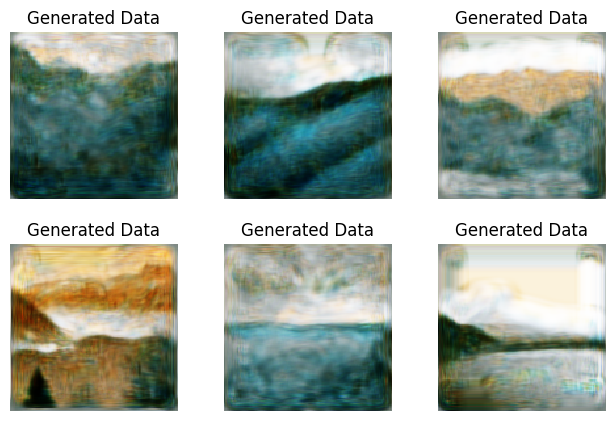

Epoch 1699: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s, loss=0.0641, v_num=7, g_loss=0.0108, d_loss=0.103] 
epoch  1699


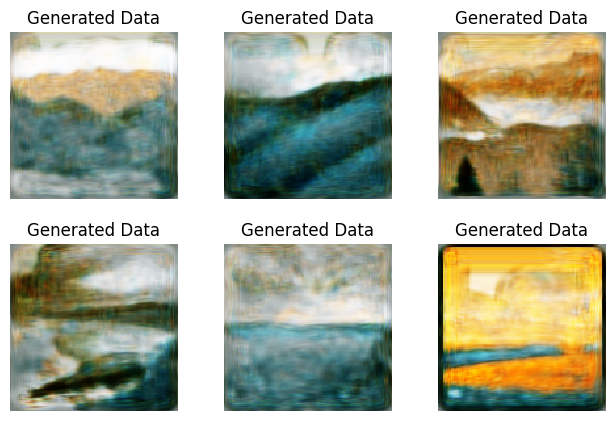

Epoch 1749: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s, loss=0.0634, v_num=7, g_loss=0.0103, d_loss=0.0956]
epoch  1749


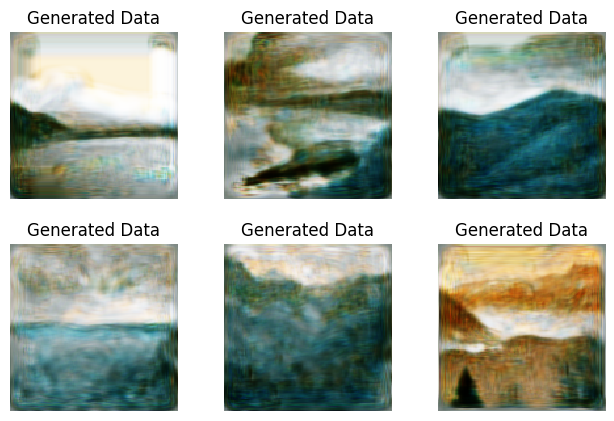

Epoch 1799: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s, loss=0.0613, v_num=7, g_loss=0.0103, d_loss=0.110] 
epoch  1799


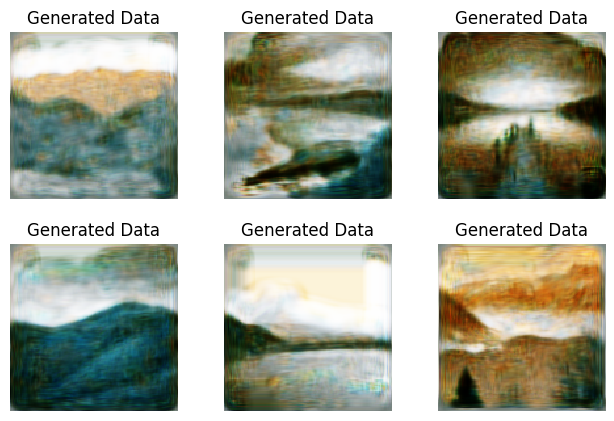

Epoch 1849: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0633, v_num=7, g_loss=0.0109, d_loss=0.0985]
epoch  1849


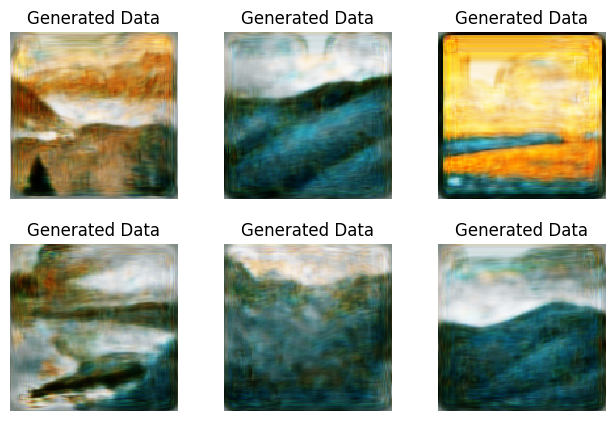

Epoch 1899: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s, loss=0.0649, v_num=7, g_loss=0.0104, d_loss=0.129] 
epoch  1899


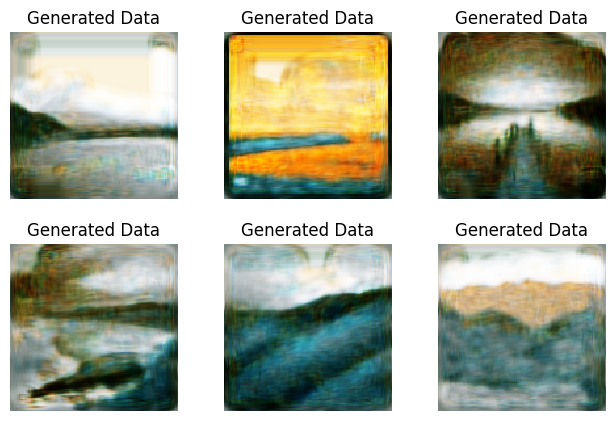

Epoch 1949: 100%|██████████| 1/1 [00:00<00:00,  1.26it/s, loss=0.0616, v_num=7, g_loss=0.011, d_loss=0.110]   
epoch  1949


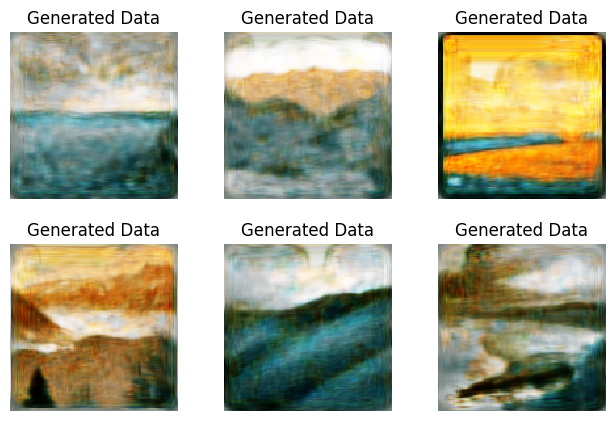

Epoch 1999: 100%|██████████| 1/1 [00:00<00:00,  1.57it/s, loss=0.0654, v_num=7, g_loss=0.0137, d_loss=0.119] 
epoch  1999


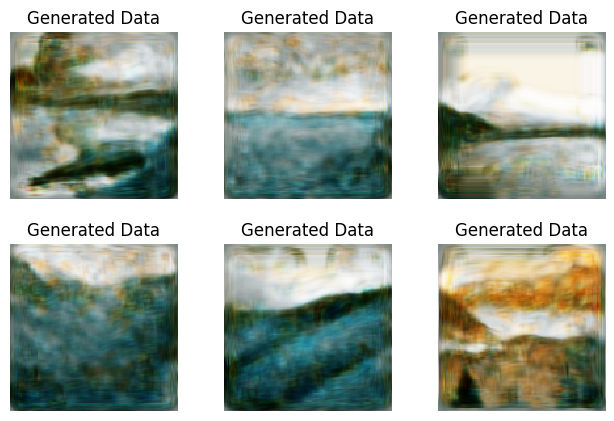

Epoch 2049: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0633, v_num=7, g_loss=0.0103, d_loss=0.119] 
epoch  2049


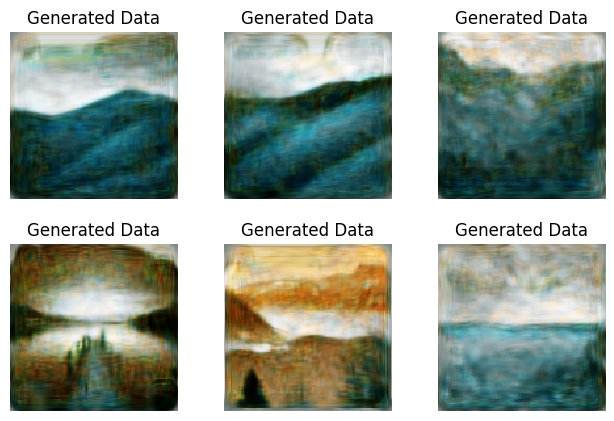

Epoch 2099: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0652, v_num=7, g_loss=0.00994, d_loss=0.128] 
epoch  2099


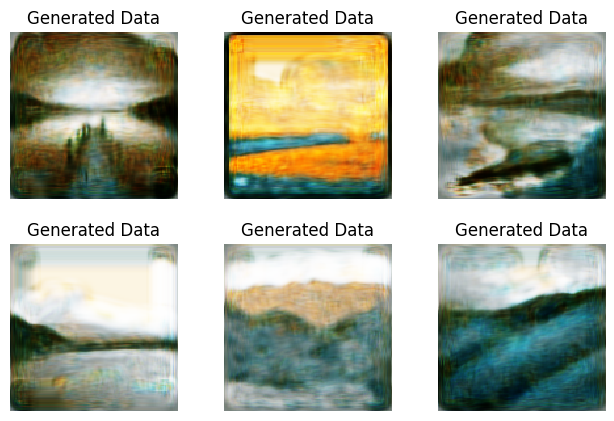

Epoch 2149: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s, loss=0.0635, v_num=7, g_loss=0.0104, d_loss=0.123]  
epoch  2149


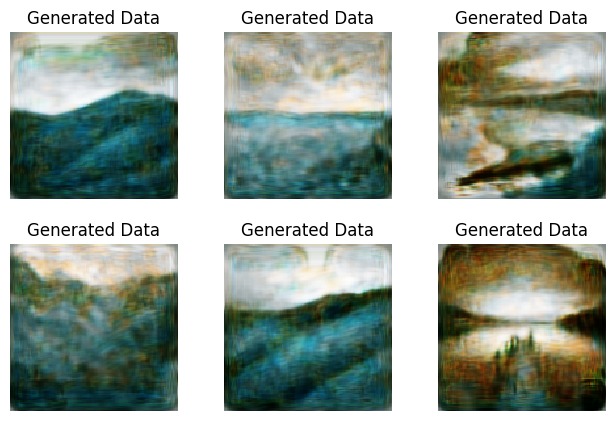

Epoch 2199: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.061, v_num=7, g_loss=0.00947, d_loss=0.109]  
epoch  2199


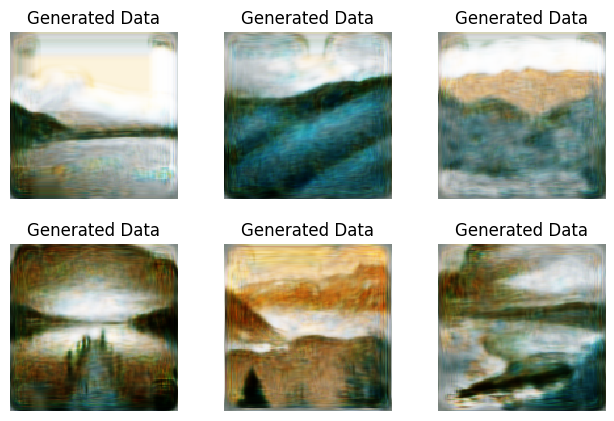

Epoch 2249: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s, loss=0.0649, v_num=7, g_loss=0.00938, d_loss=0.111] 
epoch  2249


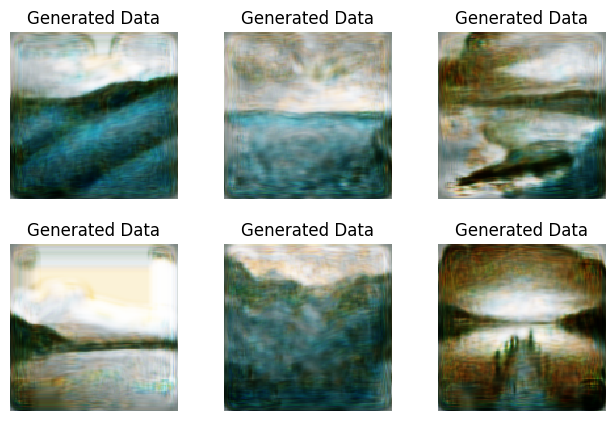

Epoch 2299: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s, loss=0.0655, v_num=7, g_loss=0.0101, d_loss=0.142]  
epoch  2299


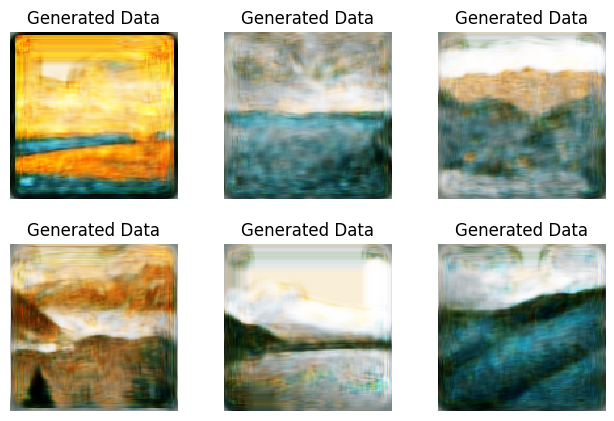

Epoch 2349: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s, loss=0.0656, v_num=7, g_loss=0.00917, d_loss=0.104] 
epoch  2349


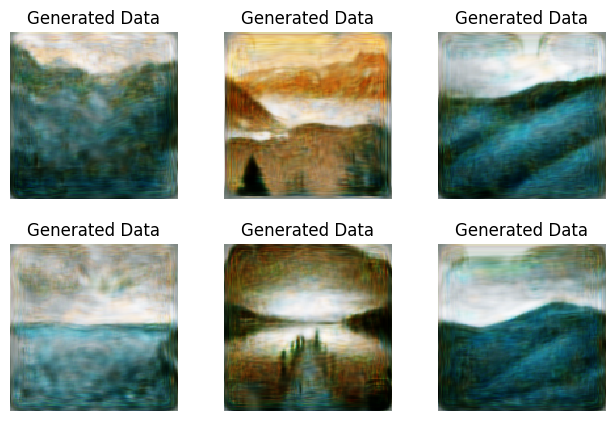

Epoch 2399: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s, loss=0.0655, v_num=7, g_loss=0.00905, d_loss=0.135] 
epoch  2399


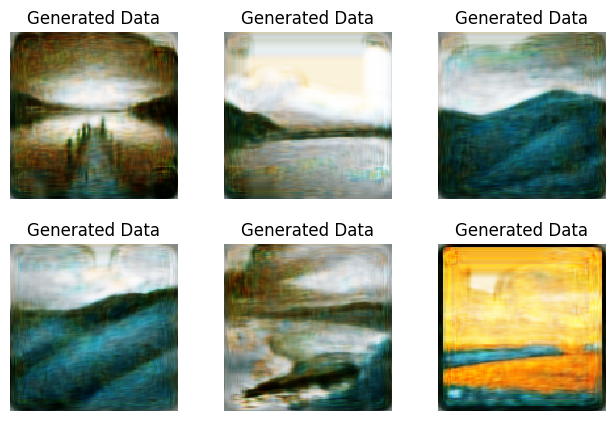

Epoch 2449: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0618, v_num=7, g_loss=0.00908, d_loss=0.120] 
epoch  2449


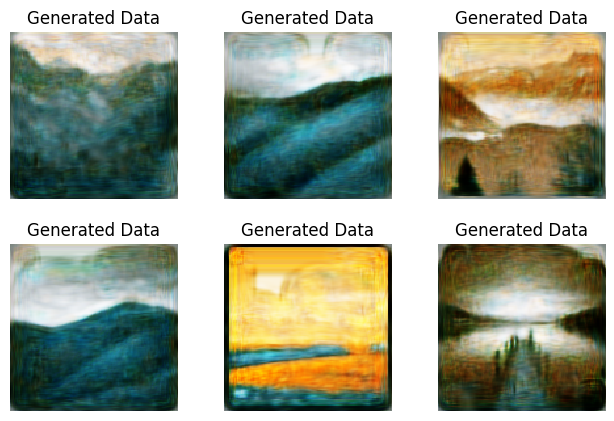

Epoch 2499: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0642, v_num=7, g_loss=0.00921, d_loss=0.124] 
epoch  2499


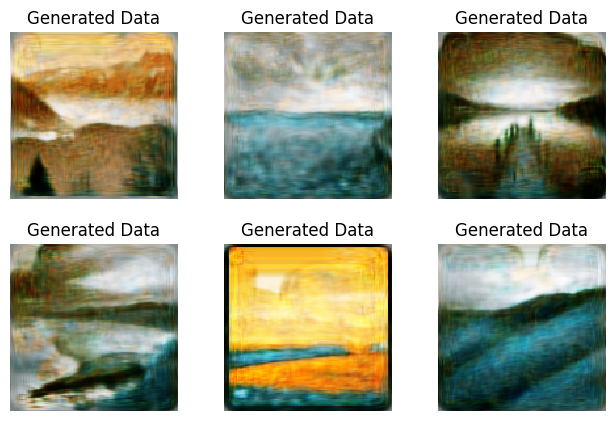

Epoch 2549: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s, loss=0.0627, v_num=7, g_loss=0.00895, d_loss=0.132] 
epoch  2549


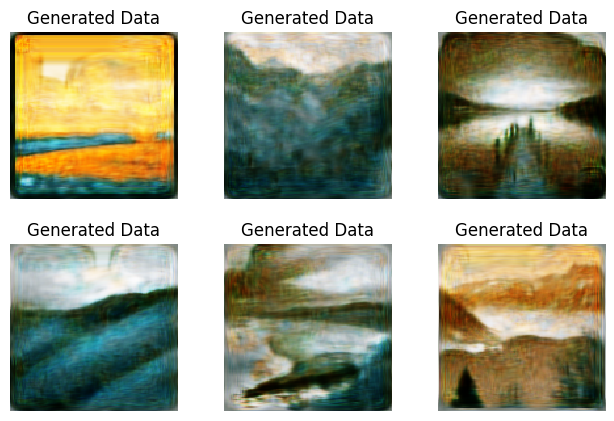

Epoch 2599: 100%|██████████| 1/1 [00:00<00:00,  1.54it/s, loss=0.0647, v_num=7, g_loss=0.0089, d_loss=0.105] 
epoch  2599


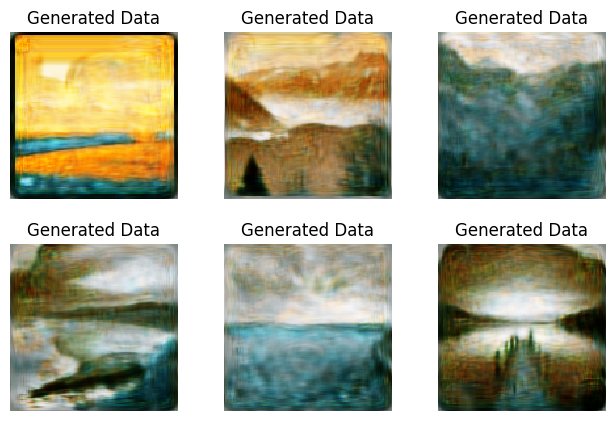

Epoch 2649: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s, loss=0.0616, v_num=7, g_loss=0.00863, d_loss=0.111] 
epoch  2649


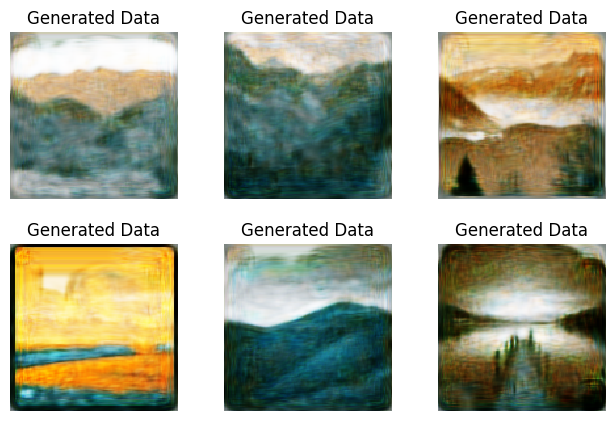

Epoch 2699: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0634, v_num=7, g_loss=0.00866, d_loss=0.128] 
epoch  2699


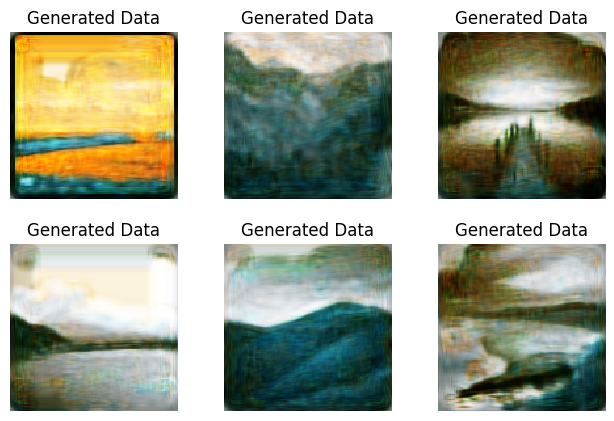

Epoch 2749: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0607, v_num=7, g_loss=0.0092, d_loss=0.106]  
epoch  2749


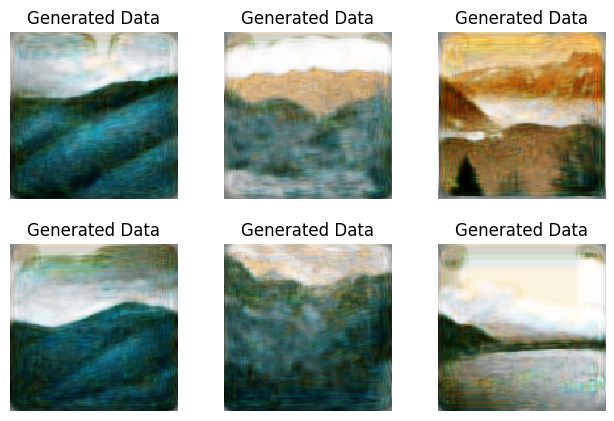

Epoch 2799: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0709, v_num=7, g_loss=0.0244, d_loss=0.123] 
epoch  2799


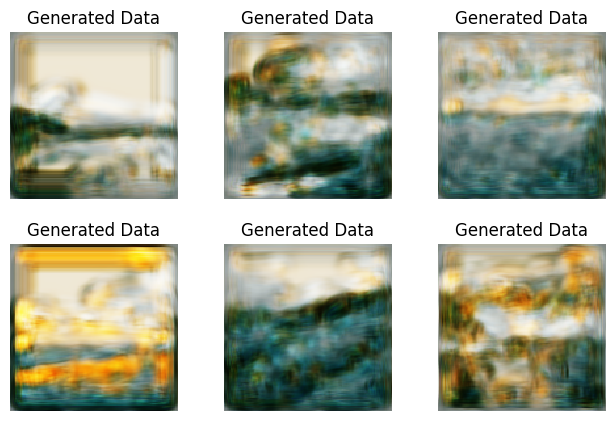

Epoch 2849: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0676, v_num=7, g_loss=0.0179, d_loss=0.0992]
epoch  2849


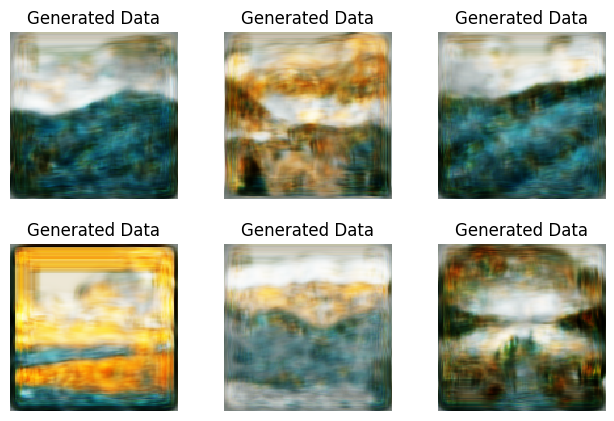

Epoch 2899: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0618, v_num=7, g_loss=0.0132, d_loss=0.104] 
epoch  2899


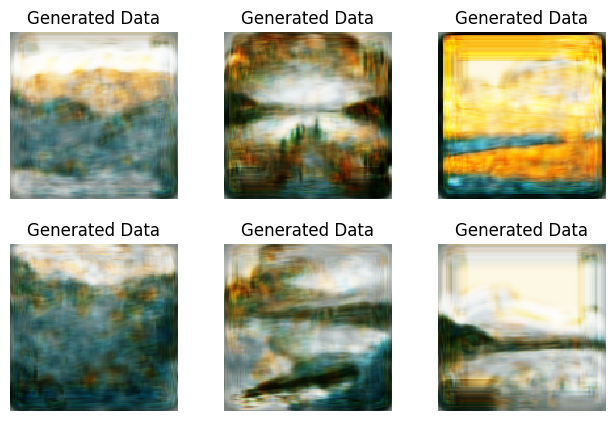

Epoch 2949: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s, loss=0.0642, v_num=7, g_loss=0.0119, d_loss=0.123] 
epoch  2949


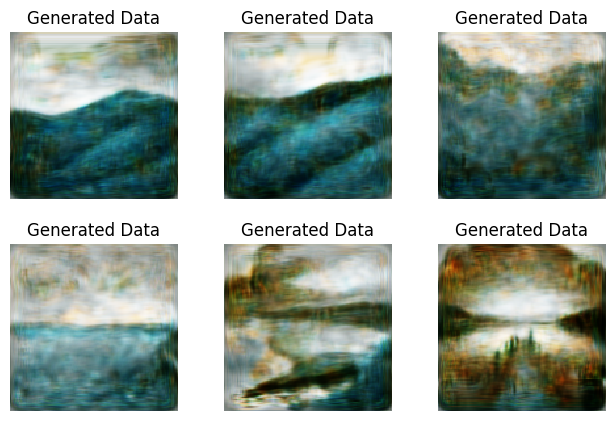

Epoch 2999: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0644, v_num=7, g_loss=0.0101, d_loss=0.120] 
epoch  2999


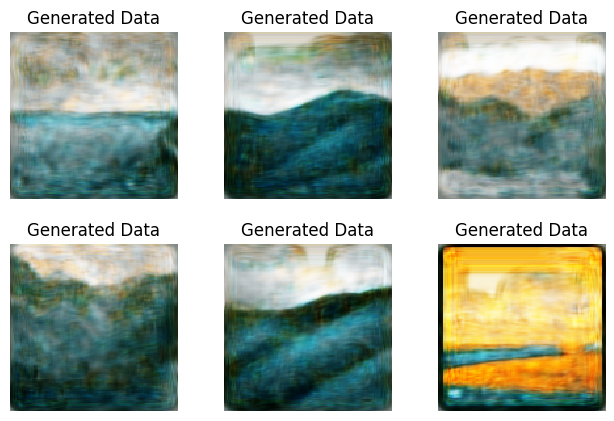

Epoch 3049: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s, loss=0.063, v_num=7, g_loss=0.00996, d_loss=0.110]  
epoch  3049


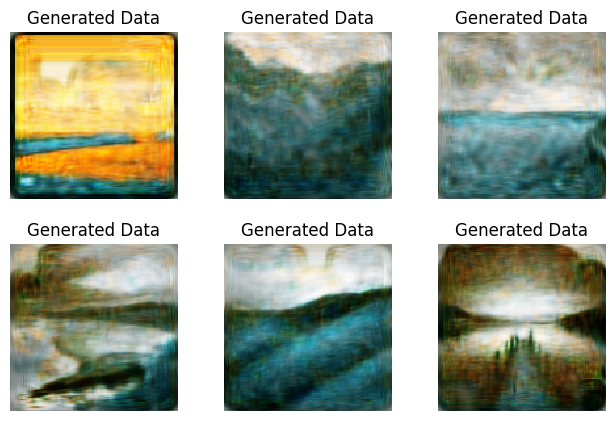

Epoch 3099: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s, loss=0.0635, v_num=7, g_loss=0.0119, d_loss=0.106]  
epoch  3099


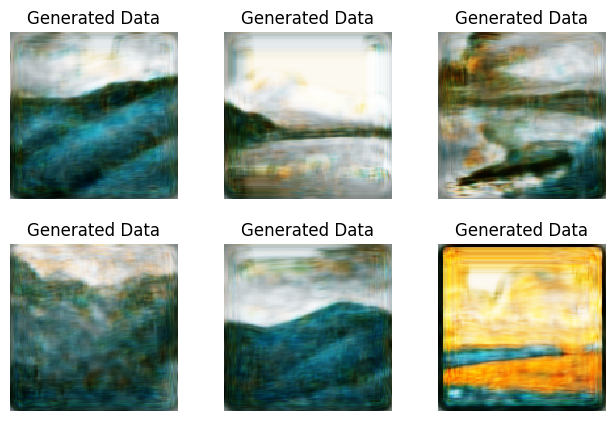

Epoch 3121:   0%|          | 0/1 [00:00<?, ?it/s, loss=0.0656, v_num=7, g_loss=0.00966, d_loss=0.111]        

c:\Users\kevr0\anaconda3\envs\datascience\lib\site-packages\pytorch_lightning\trainer\trainer.py:688: UserWarning: Detected KeyboardInterrupt, attempting graceful shutdown...
  rank_zero_warn("Detected KeyboardInterrupt, attempting graceful shutdown...")


In [27]:

# trainer = pl.Trainer(max_epochs=1000, gpus=AVAIL_GPUS, log_every_n_steps=5)
trainer = pl.Trainer(max_epochs=10000, gpus=AVAIL_GPUS)
trainer.fit(model,dataloader)